In [1]:
# for running in collab, sagemaker etc.
import sys
sys.path.insert(0, "/home/studio-lab-user/Generative_Models_for_CERN_Fast_Simulations/utils")

In [2]:
import tensorflow as tf; print(tf.config.list_physical_devices('GPU'))

2023-03-17 10:34:52.124540: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-03-17 10:34:52.124607: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-03-17 10:34:52.124614: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets, linear_model, decomposition, manifold, preprocessing
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_recall_curve, roc_curve, auc, accuracy_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold, KFold, train_test_split
from tensorflow.keras import layers
import pickle
import time
from numpy import load
from matplotlib import pyplot
import pickle
import argparse

import tensorflow as tf
from tensorflow import keras
print(tf.__version__)

from tensorflow.compat.v1.keras.layers import Input, Dense, LeakyReLU, Conv2D, MaxPooling2D, UpSampling2D,  Concatenate
from tensorflow.compat.v1.keras.models import Model
from tensorflow.compat.v1.keras.layers import Dense, Reshape, Flatten
from tensorflow.compat.v1.keras.layers import Dropout,BatchNormalization
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.losses import mse, binary_crossentropy, logcosh
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import plot_model
from tensorflow.keras import backend as K

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = "3"

from scipy.stats import wasserstein_distance
import pandas as pd
from utils import sum_channels_parallel
from sklearn.metrics import mean_absolute_error
from datetime import datetime

2.11.0


### Load and process data

In [4]:
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time

from IPython import display
import sklearn
from sklearn.preprocessing import StandardScaler
from datetime import datetime

In [5]:
data = pd.read_pickle('../data/data_proton_photonsum_70_2312.pkl')
print('Loaded: ',  data.shape, "max:", data.max())

# Data containing particle conditional data from particle having responses with proton photon sum in interval [70, 2312] without taking into consideration photon sums of neutron responses.
data_cond = pd.read_pickle('../data/data_cond_photonsum_70_2312_0_3360.pkl')
print('Loaded cond: ',  data_cond.shape, "max:",data_cond.values.max(), "min:",data_cond.values.min())

Loaded:  (40853, 56, 30) max: 765.0
Loaded cond:  (40853, 12) max: 7000.0 min: -7000.0


In [6]:
# calculate min max proton sum
photon_sum_proton_min, photon_sum_proton_max = data_cond.proton_photon_sum.min(), data_cond.proton_photon_sum.max()

In [7]:
data_cond.drop(columns=['proton_photon_sum', 'neutron_photon_sum'], inplace=True)
data_cond.columns, len(data_cond.columns)

(Index(['Pdg', 'Energy', 'Vx', 'Vy', 'Vz', 'Px', 'Py', 'Pz', 'mass', 'charge'], dtype='object'),
 10)

In [8]:
data_cond.head()

,Pdg,Energy,Vx,Vy,Vz,Px,Py,Pz,mass,charge
0,2212,3961.550,0.0,0.0,0.0,-0.076487,0.179845,3961.550,938.272081,1.0
1,2212,2778.400,0.0,0.0,0.0,-0.102053,0.152853,2778.400,938.272081,1.0
2,2212,3195.120,0.0,0.0,0.0,0.560528,-0.149980,3195.110,938.272081,1.0
3,-211,613.734,0.0,0.0,0.0,1.178260,-0.828276,-613.733,139.570610,-1.0
4,2212,3045.430,0.0,0.0,0.0,-0.449678,0.101160,3045.430,938.272081,1.0


In [9]:
DATE_STR = datetime.now().strftime("%d_%m_%Y_%H_%M")

NAME = "vae"

EXPERIMENT_DIR_NAME = f"{NAME}_{int(photon_sum_proton_min)}_{int(photon_sum_proton_max)}_{DATE_STR}"

print("Experiment DIR: ", EXPERIMENT_DIR_NAME)

Experiment DIR:  vae_70_2312_17_03_2023_10_34


In [10]:
def create_dir(path):
    isExist = os.path.exists(path)
    if not isExist:
        os.makedirs(path)

In [11]:
def save_scales(model_name, scaler_means, scaler_scales):
    out_fnm = f"{model_name}_scales.txt"
    res = "#means"
    for mean_ in scaler_means:
        res += "\n" + str(mean_)
    res += "\n\n#scales"
    for scale_ in scaler_scales:
        res += "\n" + str(scale_)

    filepath = f"../models/{EXPERIMENT_DIR_NAME}/"
    create_dir(filepath)
    with open(filepath+out_fnm, mode="w") as f:
        f.write(res)

In [12]:
data = np.log(data+1)
data = np.float32(data)
print("data max", data.max(), "min", data.min())

scaler = StandardScaler()
data_cond = np.float32(data_cond)
data_cond = scaler.fit_transform(data_cond)
print("cond max", data_cond.max(), "min", data_cond.min())

#save scales
save_scales("Proton", scaler.mean_, scaler.scale_)

data max 6.641182 min 0.0
cond max 8.353683 min -7.9837365


In [13]:
x_train, x_test, y_train, y_test, = train_test_split(data, data_cond, test_size=0.2, shuffle=False, random_state=42)
print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)

(32682, 56, 30) (8171, 56, 30) (32682, 10) (8171, 10)


In [14]:
# make tf datasets
dataset = tf.data.Dataset.from_tensor_slices(x_train).batch(batch_size=128)
dataset_cond = tf.data.Dataset.from_tensor_slices(y_train).batch(batch_size=128)
dataset_with_cond = tf.data.Dataset.zip((dataset,dataset_cond)).shuffle(12800)

val_dataset = tf.data.Dataset.from_tensor_slices(x_test).batch(batch_size=128)
val_dataset_cond = tf.data.Dataset.from_tensor_slices(y_test).batch(batch_size=128)
val_dataset_with_cond = tf.data.Dataset.zip((val_dataset,val_dataset_cond)).shuffle(12800)

### Define Model

In [15]:
############################ Define Models ############################
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


latent_dim = 10
cond_dim = 10
poz_dim = 6


############################ encoder ############################

input_img = Input(shape=[56,30,1],name='input_img')
input_cond = Input(shape=cond_dim,name='input_cond')
x = Conv2D(32, kernel_size=4, strides=2, padding='same')(input_img)
x = Conv2D(64, kernel_size=4, strides=2,padding='same')(x)
x = Conv2D(128, kernel_size=4, strides=2,padding='same')(x)
x = LeakyReLU(alpha=0.1)(x)
x = Flatten()(x)
x = layers.concatenate([input_cond,x])
x = layers.Dense(latent_dim*2, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])

encoder = keras.Model([input_img, input_cond], [z_mean, z_log_var, z], name="encoder")
encoder.summary()
############################ decoder ############################


x = Input(shape=(latent_dim,))
cond = Input(shape=(cond_dim,))
inputs = Concatenate(axis=1)([x, cond])

g = Dense(7*4*128)(inputs)
g = Reshape((7,4,128))(g)

g = UpSampling2D()(g)
g = Conv2D(128, kernel_size=4, padding='same')(g)
g = BatchNormalization()(g)
g = LeakyReLU(alpha=0)(g)

g = UpSampling2D()(g)
g = Conv2D(64, kernel_size=4, padding='same')(g)
g = BatchNormalization()(g)
g = LeakyReLU(alpha=0)(g)

g = UpSampling2D()(g)
g = Conv2D(32, kernel_size=4, padding='same')(g)
g = BatchNormalization()(g)
g = LeakyReLU(alpha=0)(g)

outputs = Conv2D(1, kernel_size=(1,3) ,activation='relu')(g)

generator = Model([x, cond], outputs, name='generator')
generator.summary()


# define losses
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
d_acc_r = keras.metrics.BinaryAccuracy(name="d_acc_r", threshold=0.5)
d_acc_f = keras.metrics.BinaryAccuracy(name="d_acc_r", threshold=0.5)
g_acc = keras.metrics.BinaryAccuracy(name="g_acc_g", threshold=0.5)

# define optimizer
vae_optimizer = tf.keras.optimizers.RMSprop(1e-4)

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_img (InputLayer)         [(None, 56, 30, 1)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 28, 15, 32)   544         ['input_img[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)              (None, 14, 8, 64)    32832       ['conv2d[0][0]']                 
                                                                                                  
 conv2d_2 (Conv2D)              (None, 7, 4, 128)    131200      ['conv2d_1[0][0]']               
                                                                                            

In [16]:
#trainin params

EPOCHS = 100
noise_dim = 10
num_examples_to_generate = 16


START_GENERATING_IMG_FROM_IDX = 20
# Seed to reuse for generating samples for comparison during training
seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed_cond = y_test[START_GENERATING_IMG_FROM_IDX:START_GENERATING_IMG_FROM_IDX+num_examples_to_generate]

### function to calculate ws distance between orginal and generated channels
org=np.exp(x_test)-1
ch_org = org.reshape(-1, 56,30)
ch_org = pd.DataFrame(sum_channels_parallel(ch_org)).values
del org

In [17]:
def calculate_ws_ch(n_calc):
    ws= [0,0,0,0,0]
    for j in range(n_calc):
        z = np.random.normal(0,1,(x_test.shape[0],10))
        z_c = y_test
        results = generator.predict([z,z_c])
        results = np.exp(results)-1
        try:
            ch_gen = np.array(results).reshape(-1,56,30)
            ch_gen = pd.DataFrame(sum_channels_parallel(ch_gen)).values
            for i in range(5):
                ws[i] = ws[i] + wasserstein_distance(ch_org[:,i], ch_gen[:,i])
            ws = np.array(ws)
        except ValueError as e:
            print(e)

    ws = ws/n_calc
    print("ws mean",f'{ws.sum()/5:.2f}', end=" ")
    for n, score in enumerate(ws):
        print("ch"+str(n+1),f'{score:.2f}',end=" ")



####################### training ##############################
@tf.function
def train_step(batch,step):

    images, cond = batch
    step=step
    BATCH_SIZE = tf.shape(images)[0]

    #train vae
    with tf.GradientTape() as tape:
        z_mean, z_log_var, z = encoder([images, cond])
        reconstruction = generator([z, cond])
        reconstruction_loss = tf.reduce_mean(
            tf.reduce_sum(
                keras.losses.mean_squared_error(tf.reshape(images,(-1,56,30,1)), reconstruction), axis=(1, 2)
            )
        )
        # kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
        # kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
        # total_loss = 0.7 * kl_loss + reconstruction_loss  
        total_loss = reconstruction_loss
        kl_loss = 0
    grads = tape.gradient(total_loss, generator.trainable_weights+encoder.trainable_weights)
    vae_optimizer.apply_gradients(zip(grads, generator.trainable_weights+encoder.trainable_weights))
    
    return total_loss, reconstruction_loss, kl_loss

In [18]:
filepath_mod = f"../models/{EXPERIMENT_DIR_NAME}/"
create_dir(filepath_mod)

history = []
history_loss = []
def train(dataset, epochs):
    tf_step = tf.Variable(0, dtype=float)
    step=0
    generate_and_save_images(generator,
                             epochs,
                             [seed, seed_cond])
    #print(calculate_ws_mae(3))
    for epoch in range(epochs):
        start = time.time()

        for batch in dataset:
            total_loss, reconstruction_loss, kl_loss =train_step(batch,tf_step)
            history.append([total_loss, reconstruction_loss, kl_loss])
            tf_step.assign_add(1)
            step = step+1

            if step%100==0:
                print("%d [Total loss: %.2f] [Recon_loss: %.2f] [KL loss: %.2f]"% (
                    step, total_loss, reconstruction_loss, kl_loss))

            if step%1000==0:
                generate_and_save_images(generator,
                               epoch,
                               [seed, seed_cond])

        generate_and_save_images(generator,
                                 epoch + 1,
                                 [seed, seed_cond]
                                 )

        # Save the model every epoch
        # encoder.compile()
        # generator.compile()
        # encoder.save(os.path.join(filepath_mod, "enc_"+NAME + "_"+ str(epoch) +".h5"))
        # generator.save(os.path.join(filepath_mod, "gen_"+NAME + "_"+ str(epoch) +".h5"))
        # np.savez(os.path.join(filepath_mod, "history_"+NAME+".npz"),
        #          np.array(history))
        calculate_ws_ch(min(epoch//5+1, 5))

        print('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

    return history


filepath_img = f"../images/{EXPERIMENT_DIR_NAME}/"
create_dir(filepath_img)

In [19]:
def generate_and_save_images(model, epoch, test_input):
    
    SUPTITLE_TXT = f"\nModel: VAE proton data" \
               f"\nPhotonsum interval: [{photon_sum_proton_min}, {photon_sum_proton_max}]" \
               f"\nEPOCH: {epoch}"
    # Notice `training` is set to False.
    # This is so all layers run in inference mode (batchnorm).
    predictions = model(test_input, training=False)  # returns 16 responses
    fig, axs = plt.subplots(2, 7, figsize=(15, 5))
    fig.suptitle(SUPTITLE_TXT, x=0.1, horizontalalignment='left')
    
    for i in range(0, 14):
        if i < 7:
            x = x_test[START_GENERATING_IMG_FROM_IDX+i].reshape(56, 30)
        else:
            x = predictions[i-7].numpy().reshape(56, 30)
        #x[x<=0]=x.max()*-0.1
        im = axs[i // 7, i % 7].imshow(x, cmap='gnuplot')
        axs[i // 7, i % 7].axis('off')
        fig.colorbar(im, ax=axs[i // 7, i % 7])

    fig.tight_layout(rect=[0, 0, 1, 0.975])
    # plt.savefig(os.path.join(filepath_img, 'image_at_epoch_{:04d}.png'.format(epoch)))
    plt.show()

### Train model

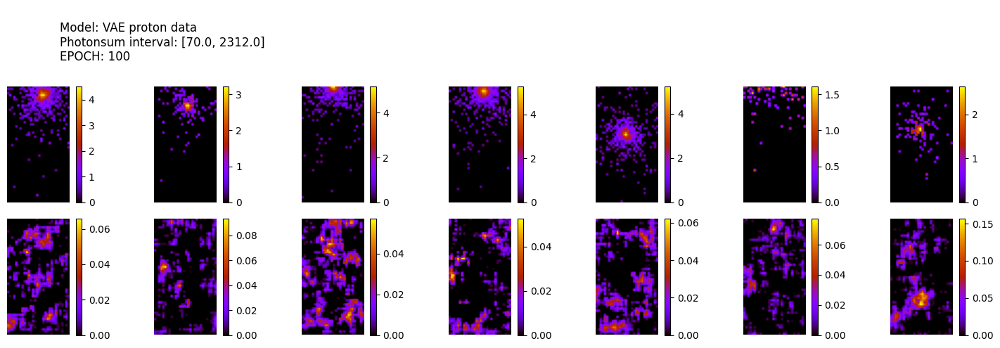

100 [Total loss: 130.08] [Recon_loss: 130.08] [KL loss: 0.00]
200 [Total loss: 101.23] [Recon_loss: 101.23] [KL loss: 0.00]


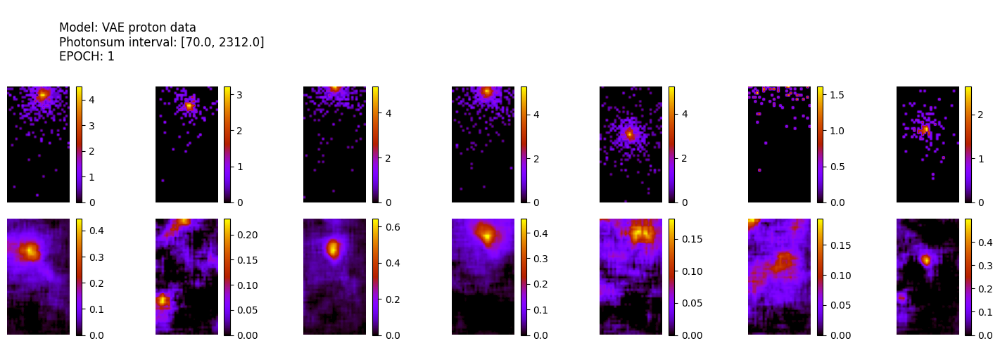

256/256 [==============================] - 1s 4ms/step
ws mean 114.44 ch1 0.13 ch2 94.05 ch3 0.74 ch4 192.11 ch5 285.15 Time for epoch 1 is 20.249764442443848 sec
300 [Total loss: 106.35] [Recon_loss: 106.35] [KL loss: 0.00]
400 [Total loss: 97.12] [Recon_loss: 97.12] [KL loss: 0.00]
500 [Total loss: 95.85] [Recon_loss: 95.85] [KL loss: 0.00]


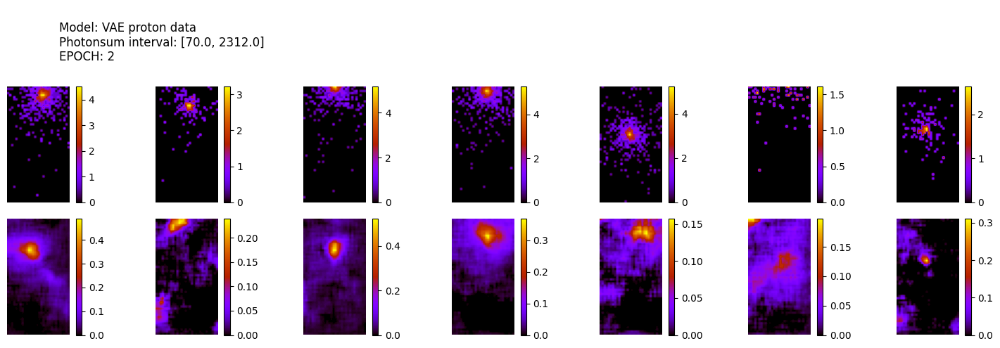

256/256 [==============================] - 1s 3ms/step
ws mean 118.86 ch1 0.17 ch2 99.24 ch3 0.76 ch4 197.31 ch5 296.84 Time for epoch 2 is 14.520654916763306 sec
600 [Total loss: 101.91] [Recon_loss: 101.91] [KL loss: 0.00]
700 [Total loss: 92.38] [Recon_loss: 92.38] [KL loss: 0.00]


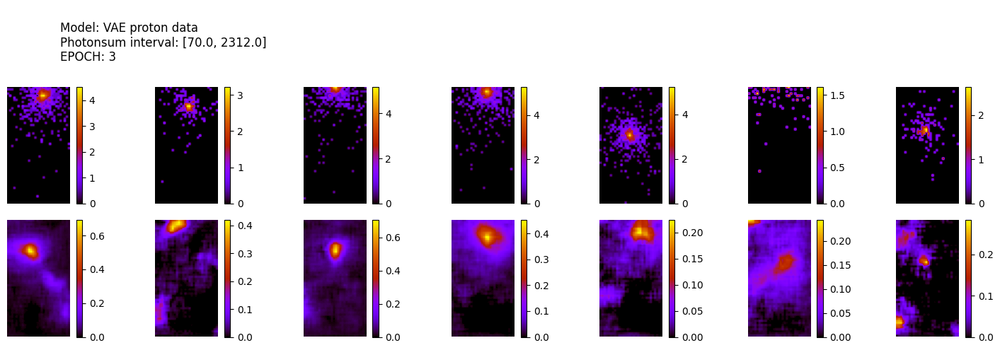

256/256 [==============================] - 1s 3ms/step
ws mean 115.97 ch1 0.15 ch2 94.22 ch3 0.75 ch4 195.22 ch5 289.54 Time for epoch 3 is 14.370270729064941 sec
800 [Total loss: 102.53] [Recon_loss: 102.53] [KL loss: 0.00]
900 [Total loss: 94.66] [Recon_loss: 94.66] [KL loss: 0.00]
1000 [Total loss: 96.83] [Recon_loss: 96.83] [KL loss: 0.00]


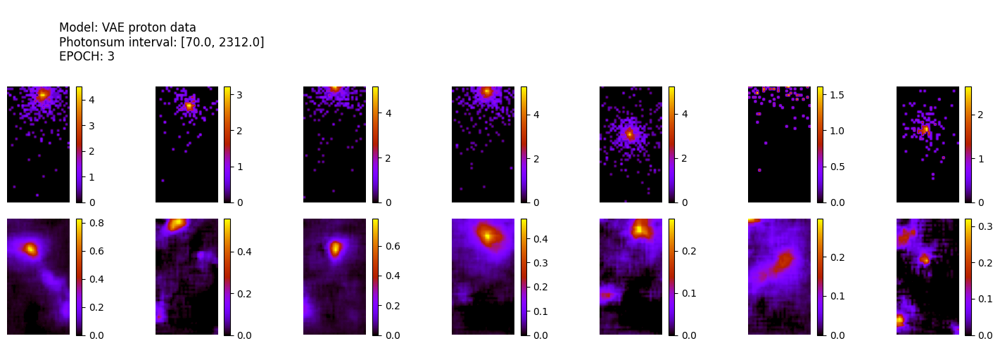

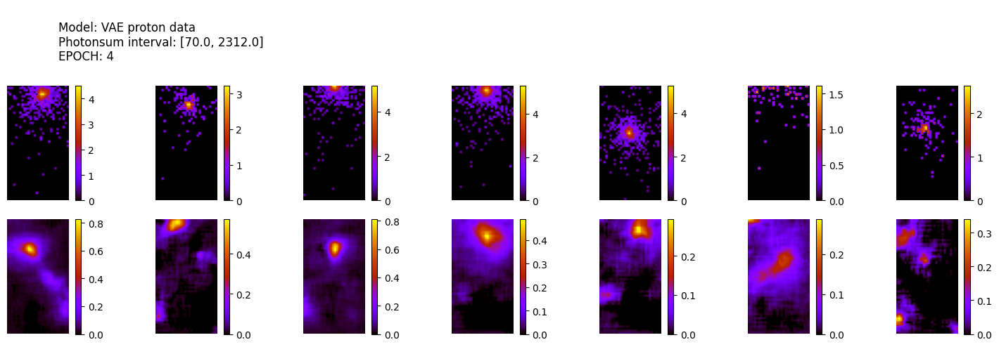

256/256 [==============================] - 1s 3ms/step
ws mean 115.09 ch1 0.14 ch2 92.35 ch3 0.74 ch4 194.82 ch5 287.37 Time for epoch 4 is 15.785417795181274 sec
1100 [Total loss: 97.04] [Recon_loss: 97.04] [KL loss: 0.00]
1200 [Total loss: 99.29] [Recon_loss: 99.29] [KL loss: 0.00]


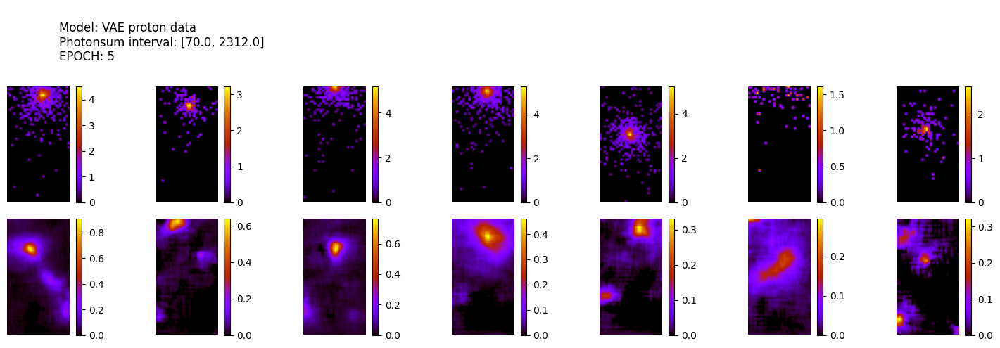

256/256 [==============================] - 1s 3ms/step
ws mean 116.29 ch1 0.14 ch2 93.89 ch3 0.76 ch4 196.17 ch5 290.47 Time for epoch 5 is 14.59352159500122 sec
1300 [Total loss: 94.87] [Recon_loss: 94.87] [KL loss: 0.00]
1400 [Total loss: 91.76] [Recon_loss: 91.76] [KL loss: 0.00]
1500 [Total loss: 94.89] [Recon_loss: 94.89] [KL loss: 0.00]


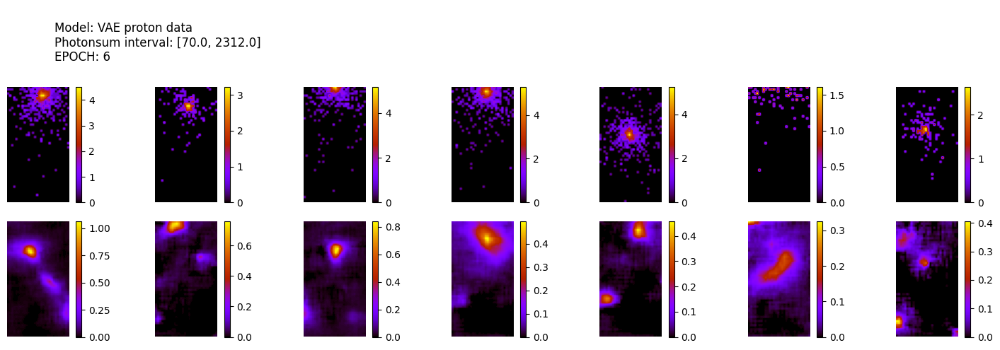

256/256 [==============================] - 1s 3ms/step
ws mean 116.05 ch1 0.14 ch2 93.49 ch3 0.75 ch4 196.01 ch5 289.88 Time for epoch 6 is 16.59415364265442 sec
1600 [Total loss: 96.05] [Recon_loss: 96.05] [KL loss: 0.00]
1700 [Total loss: 100.24] [Recon_loss: 100.24] [KL loss: 0.00]


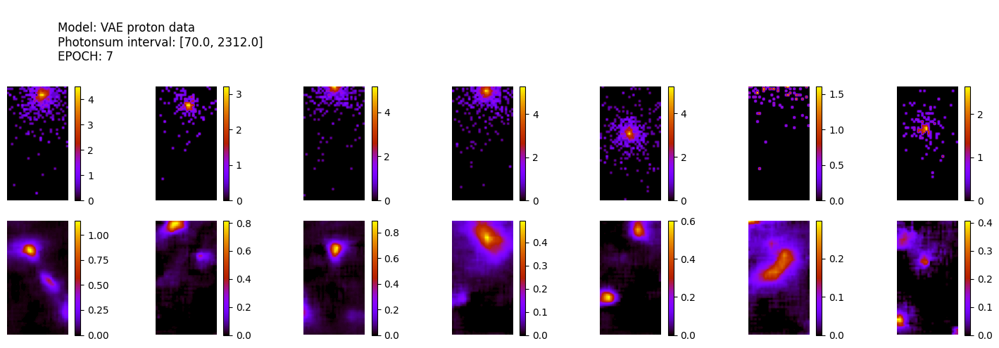

256/256 [==============================] - 1s 3ms/step
ws mean 116.78 ch1 0.15 ch2 94.42 ch3 0.76 ch4 196.85 ch5 291.72 Time for epoch 7 is 16.431852102279663 sec
1800 [Total loss: 93.04] [Recon_loss: 93.04] [KL loss: 0.00]
1900 [Total loss: 89.91] [Recon_loss: 89.91] [KL loss: 0.00]
2000 [Total loss: 93.95] [Recon_loss: 93.95] [KL loss: 0.00]


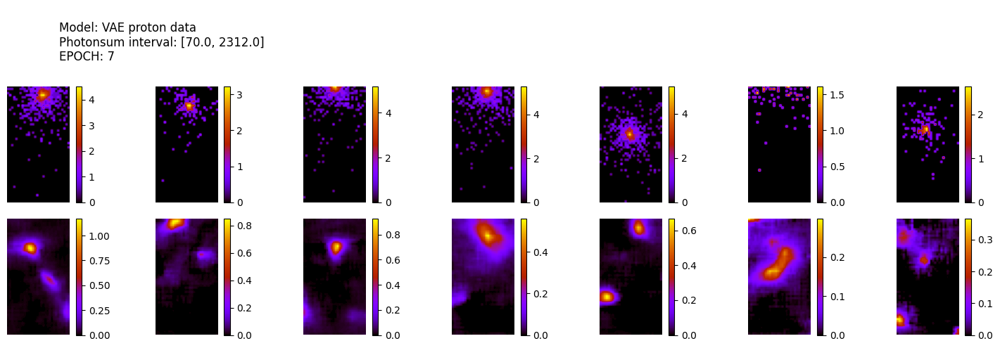

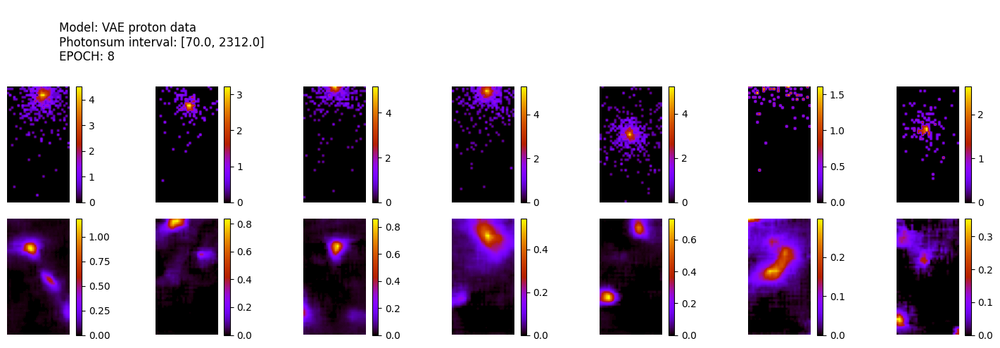

256/256 [==============================] - 1s 3ms/step
ws mean 117.58 ch1 0.15 ch2 95.83 ch3 0.76 ch4 197.43 ch5 293.72 Time for epoch 8 is 17.909120559692383 sec
2100 [Total loss: 94.15] [Recon_loss: 94.15] [KL loss: 0.00]
2200 [Total loss: 87.69] [Recon_loss: 87.69] [KL loss: 0.00]
2300 [Total loss: 86.92] [Recon_loss: 86.92] [KL loss: 0.00]


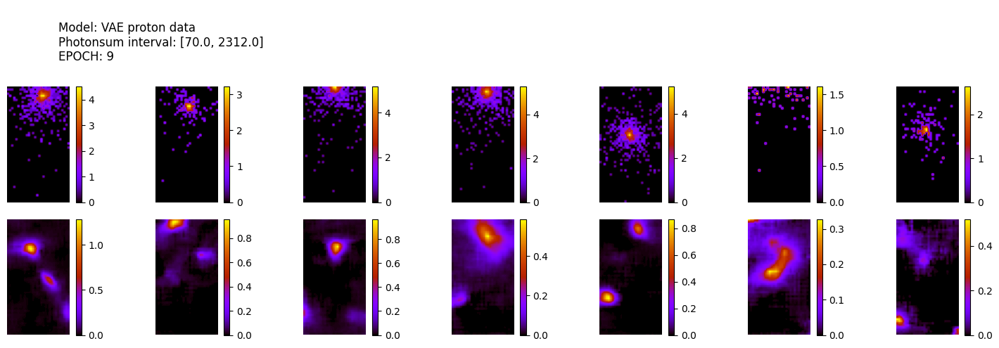

256/256 [==============================] - 1s 3ms/step
ws mean 117.17 ch1 0.16 ch2 95.43 ch3 0.75 ch4 196.82 ch5 292.71 Time for epoch 9 is 16.656001091003418 sec
2400 [Total loss: 91.15] [Recon_loss: 91.15] [KL loss: 0.00]
2500 [Total loss: 93.63] [Recon_loss: 93.63] [KL loss: 0.00]


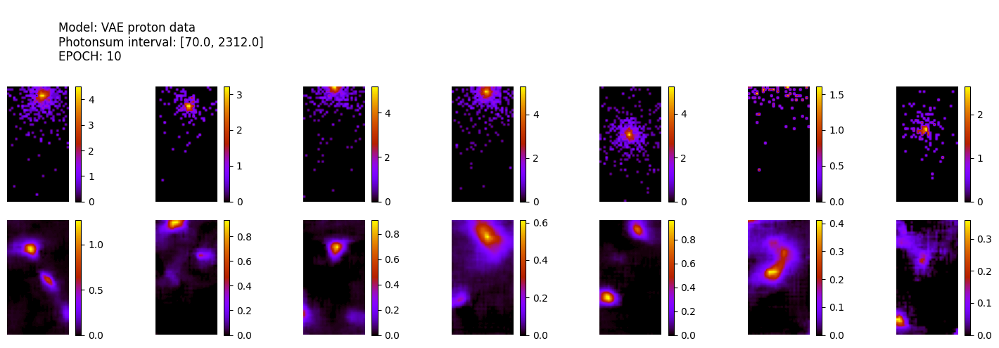

256/256 [==============================] - 1s 3ms/step
ws mean 117.06 ch1 0.16 ch2 95.50 ch3 0.75 ch4 196.47 ch5 292.44 Time for epoch 10 is 16.468841791152954 sec
2600 [Total loss: 95.22] [Recon_loss: 95.22] [KL loss: 0.00]
2700 [Total loss: 98.31] [Recon_loss: 98.31] [KL loss: 0.00]
2800 [Total loss: 92.17] [Recon_loss: 92.17] [KL loss: 0.00]


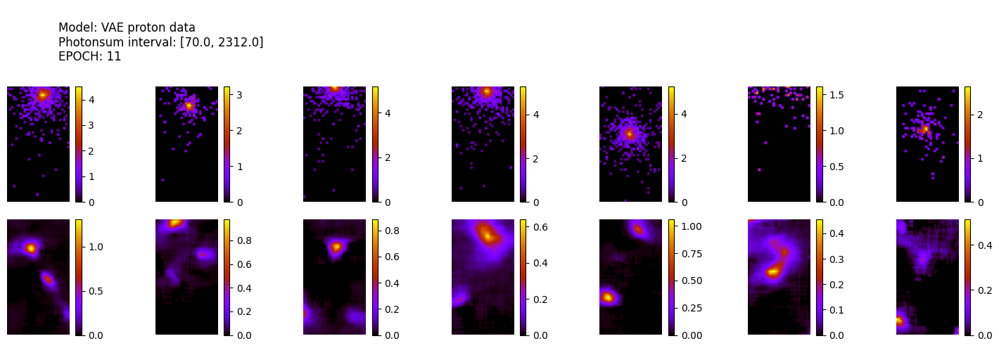

256/256 [==============================] - 1s 3ms/step
ws mean 117.68 ch1 0.15 ch2 96.65 ch3 0.76 ch4 196.87 ch5 293.97 Time for epoch 11 is 18.68423295021057 sec
2900 [Total loss: 92.89] [Recon_loss: 92.89] [KL loss: 0.00]
3000 [Total loss: 91.51] [Recon_loss: 91.51] [KL loss: 0.00]


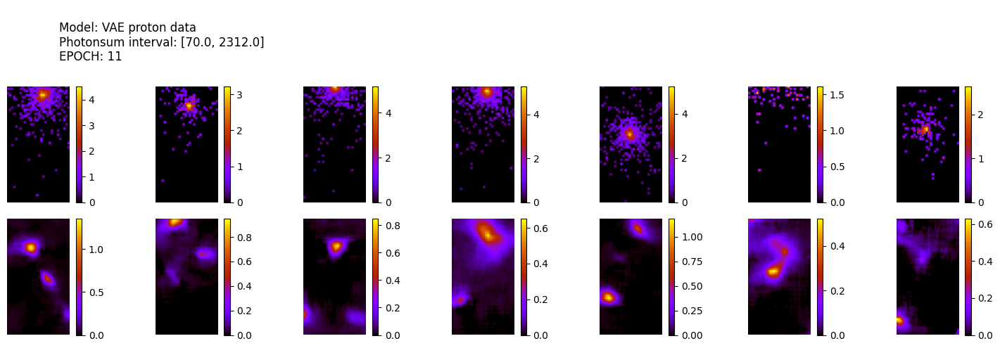

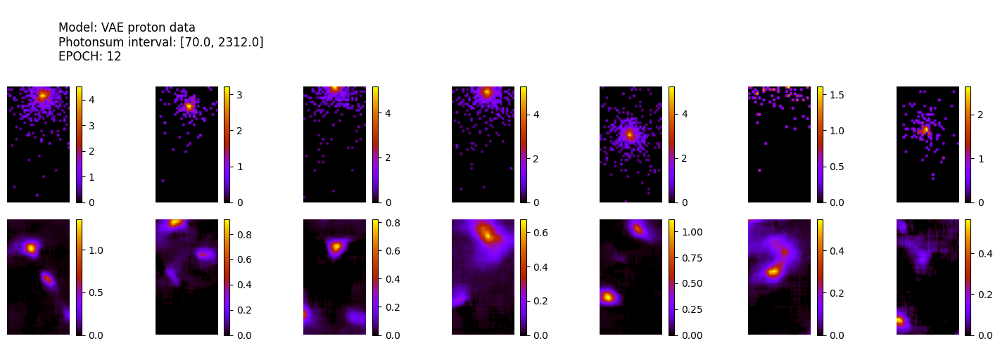

256/256 [==============================] - 1s 3ms/step
ws mean 117.32 ch1 0.15 ch2 96.34 ch3 0.74 ch4 196.28 ch5 293.07 Time for epoch 12 is 19.873152494430542 sec
3100 [Total loss: 86.67] [Recon_loss: 86.67] [KL loss: 0.00]
3200 [Total loss: 86.42] [Recon_loss: 86.42] [KL loss: 0.00]
3300 [Total loss: 92.47] [Recon_loss: 92.47] [KL loss: 0.00]


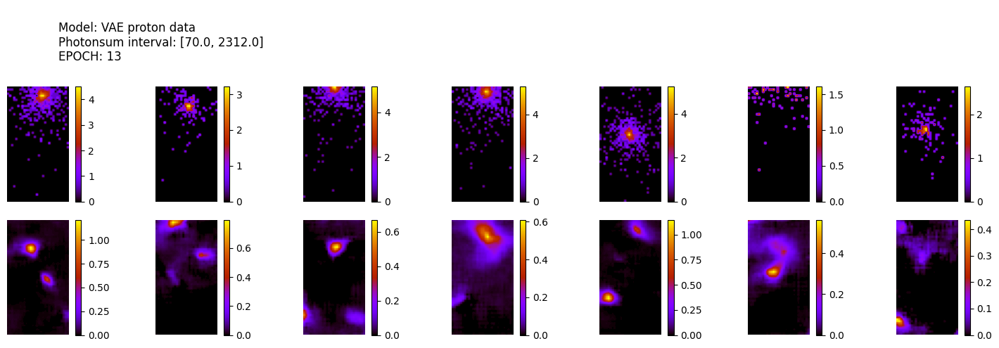

256/256 [==============================] - 1s 3ms/step
ws mean 119.54 ch1 0.16 ch2 99.96 ch3 0.76 ch4 198.18 ch5 298.63 Time for epoch 13 is 18.702208995819092 sec
3400 [Total loss: 93.58] [Recon_loss: 93.58] [KL loss: 0.00]
3500 [Total loss: 91.56] [Recon_loss: 91.56] [KL loss: 0.00]


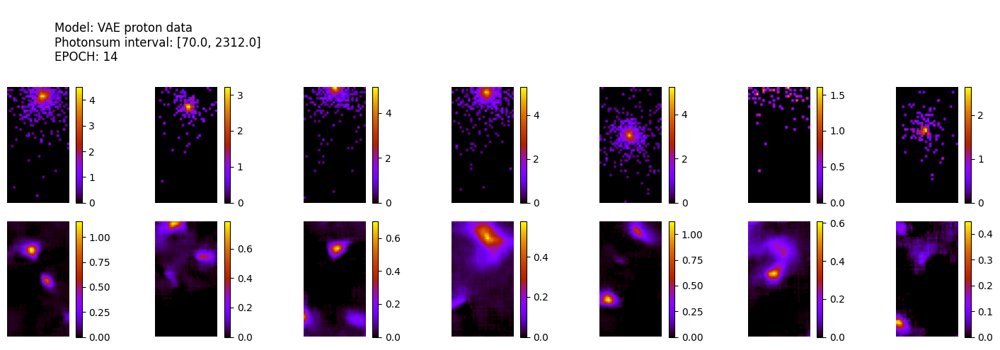

256/256 [==============================] - 1s 3ms/step
ws mean 119.51 ch1 0.16 ch2 99.98 ch3 0.76 ch4 198.12 ch5 298.55 Time for epoch 14 is 18.473299503326416 sec
3600 [Total loss: 94.04] [Recon_loss: 94.04] [KL loss: 0.00]
3700 [Total loss: 85.51] [Recon_loss: 85.51] [KL loss: 0.00]
3800 [Total loss: 91.32] [Recon_loss: 91.32] [KL loss: 0.00]


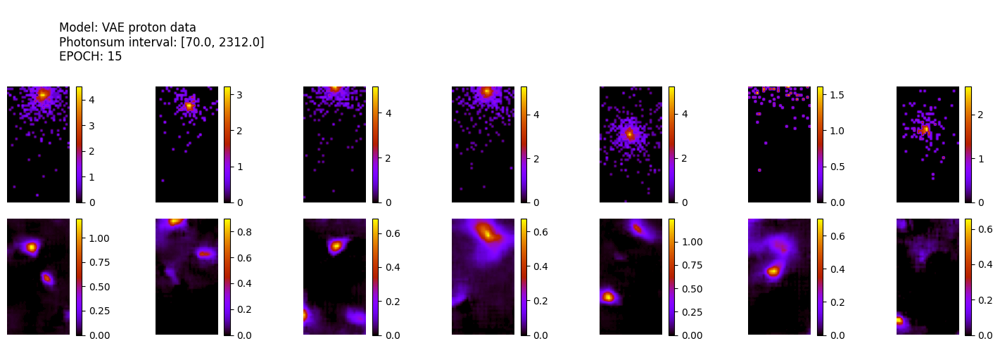

256/256 [==============================] - 1s 3ms/step
ws mean 118.53 ch1 0.17 ch2 98.81 ch3 0.74 ch4 196.83 ch5 296.08 Time for epoch 15 is 18.6955087184906 sec
3900 [Total loss: 91.25] [Recon_loss: 91.25] [KL loss: 0.00]
4000 [Total loss: 88.88] [Recon_loss: 88.88] [KL loss: 0.00]


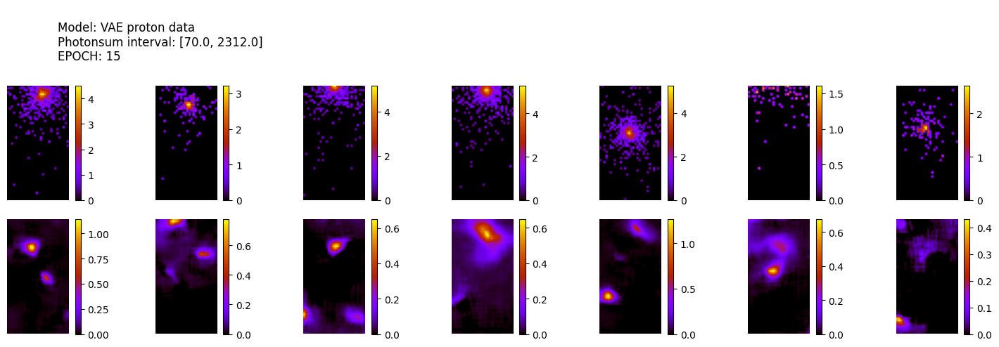

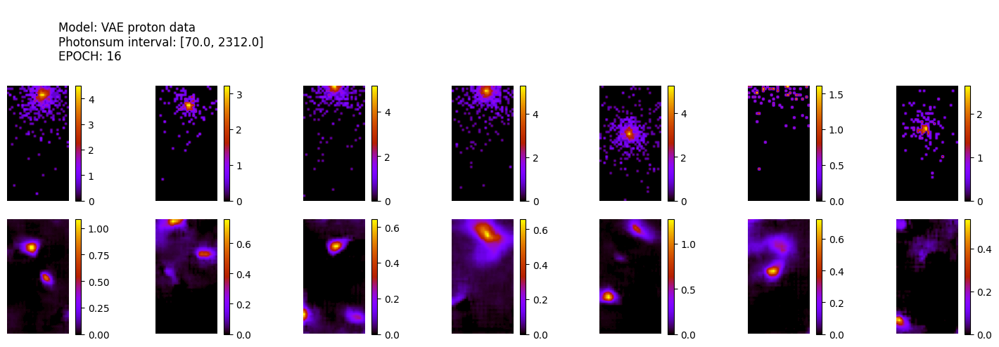

256/256 [==============================] - 1s 4ms/step
ws mean 118.69 ch1 0.16 ch2 99.06 ch3 0.75 ch4 196.98 ch5 296.50 Time for epoch 16 is 21.85648202896118 sec
4100 [Total loss: 90.99] [Recon_loss: 90.99] [KL loss: 0.00]
4200 [Total loss: 88.53] [Recon_loss: 88.53] [KL loss: 0.00]
4300 [Total loss: 94.09] [Recon_loss: 94.09] [KL loss: 0.00]


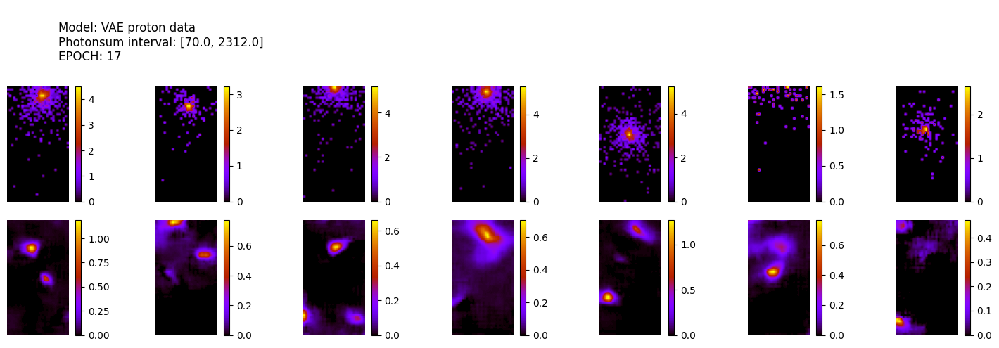

256/256 [==============================] - 1s 3ms/step
ws mean 118.36 ch1 0.16 ch2 99.15 ch3 0.75 ch4 196.07 ch5 295.68 Time for epoch 17 is 20.684000492095947 sec
4400 [Total loss: 84.43] [Recon_loss: 84.43] [KL loss: 0.00]
4500 [Total loss: 88.48] [Recon_loss: 88.48] [KL loss: 0.00]
4600 [Total loss: 91.54] [Recon_loss: 91.54] [KL loss: 0.00]


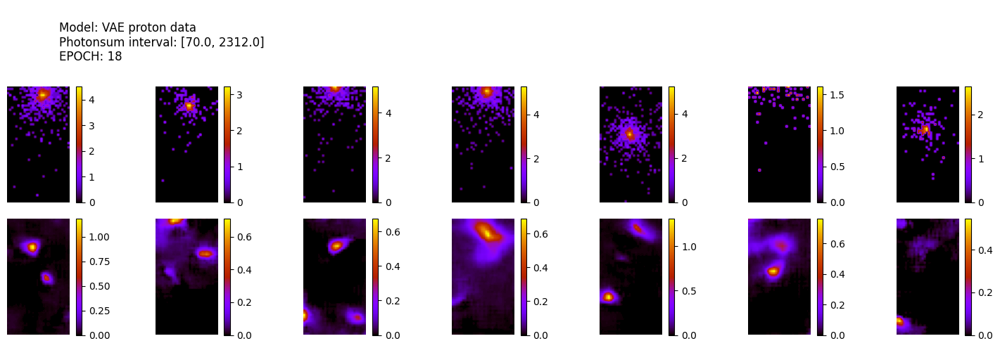

256/256 [==============================] - 1s 4ms/step
ws mean 118.28 ch1 0.16 ch2 98.87 ch3 0.75 ch4 196.13 ch5 295.46 Time for epoch 18 is 20.538340091705322 sec
4700 [Total loss: 83.64] [Recon_loss: 83.64] [KL loss: 0.00]
4800 [Total loss: 91.17] [Recon_loss: 91.17] [KL loss: 0.00]


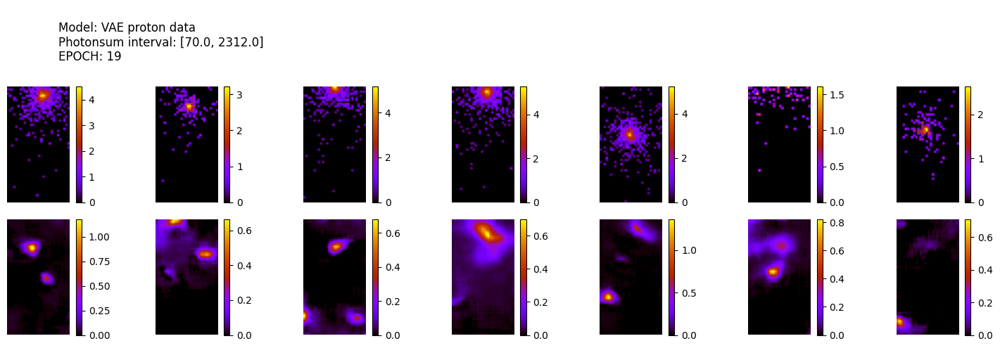

256/256 [==============================] - 1s 3ms/step
ws mean 118.05 ch1 0.16 ch2 98.86 ch3 0.76 ch4 195.57 ch5 294.91 Time for epoch 19 is 20.67160439491272 sec
4900 [Total loss: 90.08] [Recon_loss: 90.08] [KL loss: 0.00]
5000 [Total loss: 86.67] [Recon_loss: 86.67] [KL loss: 0.00]


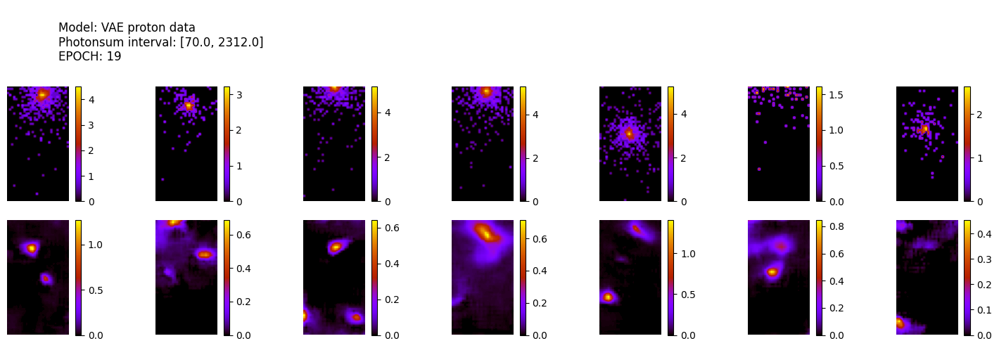

5100 [Total loss: 96.68] [Recon_loss: 96.68] [KL loss: 0.00]


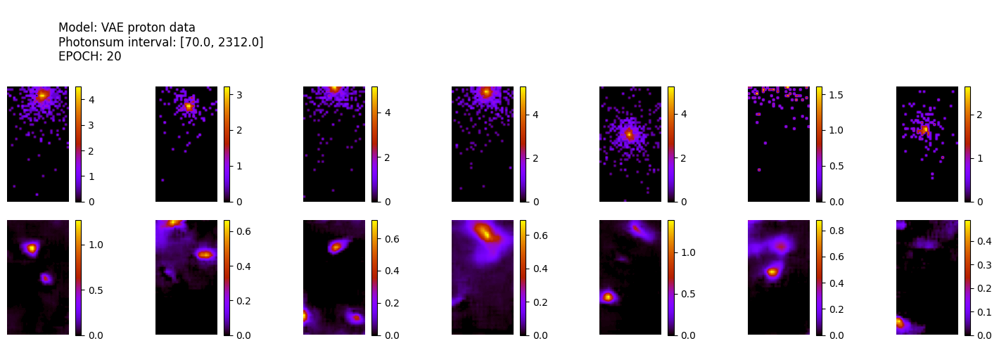

256/256 [==============================] - 1s 4ms/step
ws mean 118.41 ch1 0.16 ch2 99.24 ch3 0.74 ch4 196.12 ch5 295.80 Time for epoch 20 is 21.873525142669678 sec
5200 [Total loss: 90.25] [Recon_loss: 90.25] [KL loss: 0.00]
5300 [Total loss: 92.91] [Recon_loss: 92.91] [KL loss: 0.00]


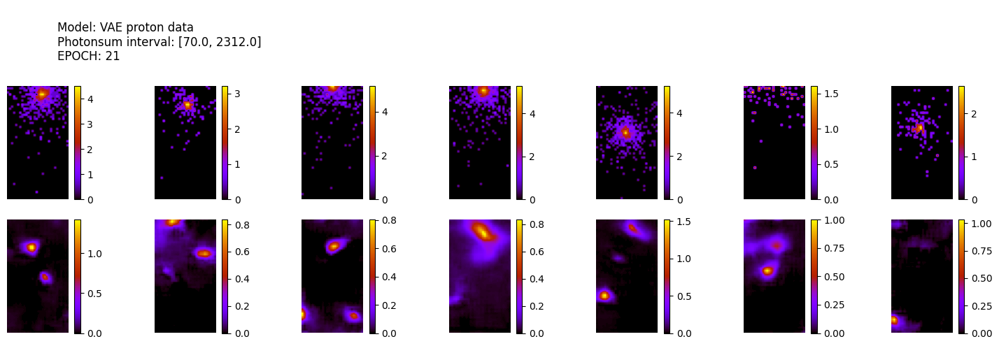

256/256 [==============================] - 1s 3ms/step
ws mean 115.25 ch1 0.14 ch2 94.74 ch3 0.74 ch4 192.75 ch5 287.90 Time for epoch 21 is 22.462706089019775 sec
5400 [Total loss: 92.52] [Recon_loss: 92.52] [KL loss: 0.00]
5500 [Total loss: 92.57] [Recon_loss: 92.57] [KL loss: 0.00]
5600 [Total loss: 90.28] [Recon_loss: 90.28] [KL loss: 0.00]


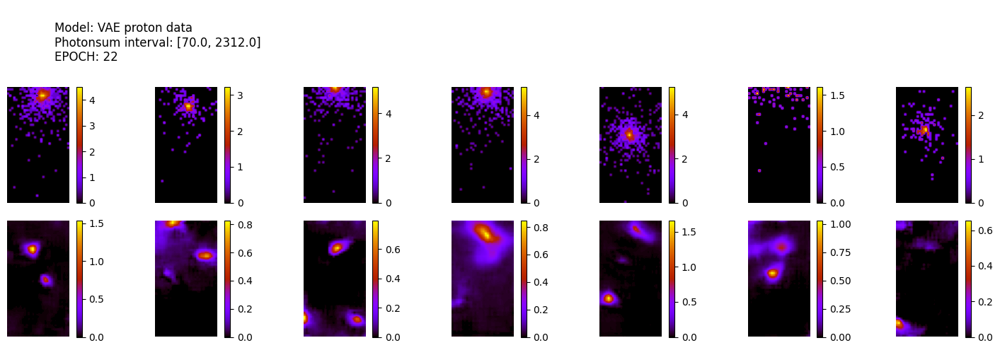

256/256 [==============================] - 1s 3ms/step
ws mean 115.36 ch1 0.14 ch2 94.86 ch3 0.74 ch4 192.90 ch5 288.15 Time for epoch 22 is 22.60820508003235 sec
5700 [Total loss: 93.74] [Recon_loss: 93.74] [KL loss: 0.00]
5800 [Total loss: 83.12] [Recon_loss: 83.12] [KL loss: 0.00]


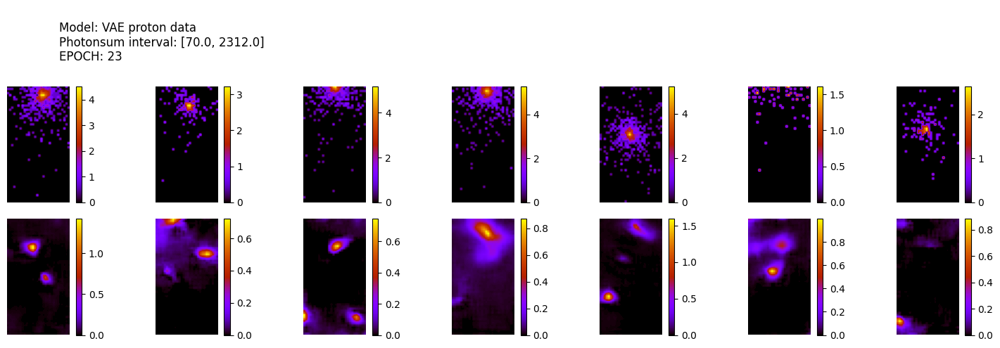

256/256 [==============================] - 1s 4ms/step
ws mean 116.13 ch1 0.14 ch2 96.09 ch3 0.74 ch4 193.58 ch5 290.08 Time for epoch 23 is 22.645071983337402 sec
5900 [Total loss: 87.25] [Recon_loss: 87.25] [KL loss: 0.00]
6000 [Total loss: 84.85] [Recon_loss: 84.85] [KL loss: 0.00]


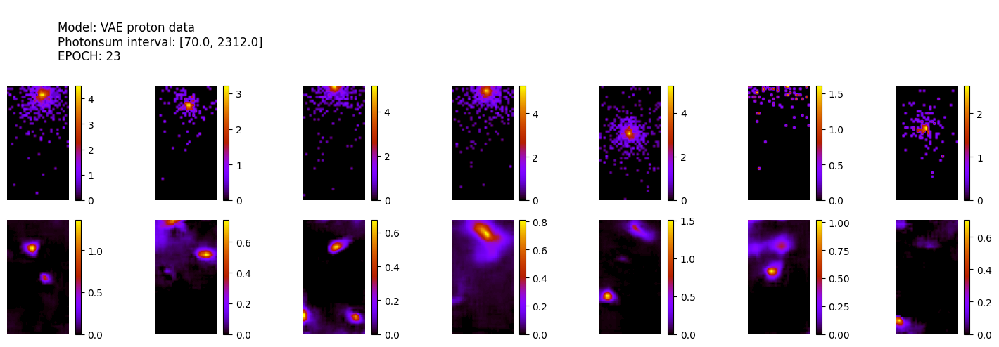

6100 [Total loss: 92.43] [Recon_loss: 92.43] [KL loss: 0.00]


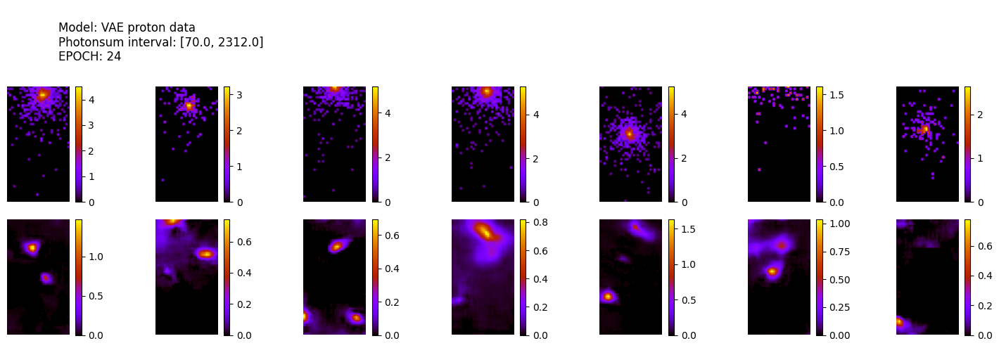

256/256 [==============================] - 1s 3ms/step
ws mean 116.85 ch1 0.15 ch2 97.33 ch3 0.74 ch4 194.13 ch5 291.88 Time for epoch 24 is 23.885596990585327 sec
6200 [Total loss: 86.70] [Recon_loss: 86.70] [KL loss: 0.00]
6300 [Total loss: 82.67] [Recon_loss: 82.67] [KL loss: 0.00]
6400 [Total loss: 85.04] [Recon_loss: 85.04] [KL loss: 0.00]


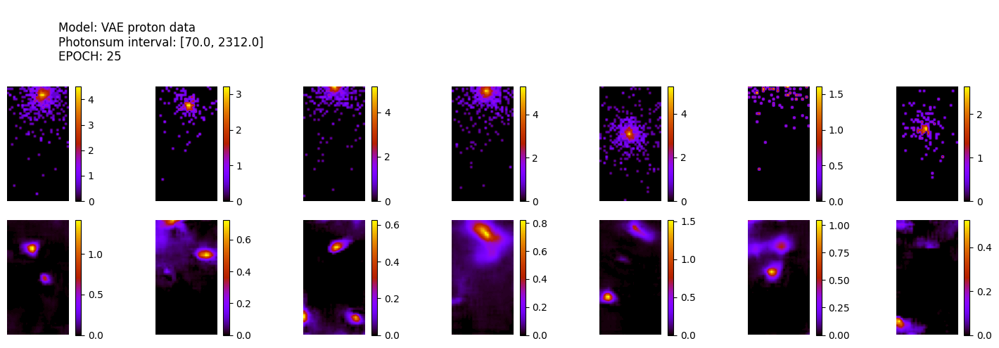

256/256 [==============================] - 1s 3ms/step
ws mean 116.85 ch1 0.15 ch2 97.36 ch3 0.74 ch4 194.10 ch5 291.88 Time for epoch 25 is 22.471109628677368 sec
6500 [Total loss: 86.06] [Recon_loss: 86.06] [KL loss: 0.00]
6600 [Total loss: 91.02] [Recon_loss: 91.02] [KL loss: 0.00]


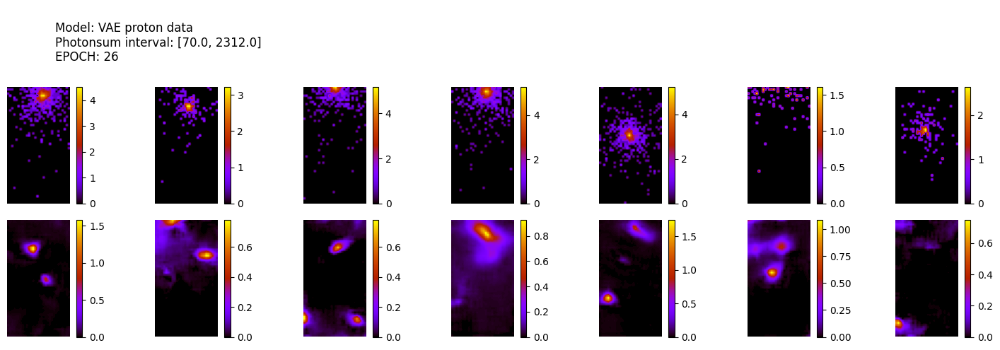

256/256 [==============================] - 1s 4ms/step
ws mean 115.23 ch1 0.15 ch2 94.98 ch3 0.74 ch4 192.45 ch5 287.85 Time for epoch 26 is 22.69668173789978 sec
6700 [Total loss: 88.97] [Recon_loss: 88.97] [KL loss: 0.00]
6800 [Total loss: 82.81] [Recon_loss: 82.81] [KL loss: 0.00]
6900 [Total loss: 86.28] [Recon_loss: 86.28] [KL loss: 0.00]


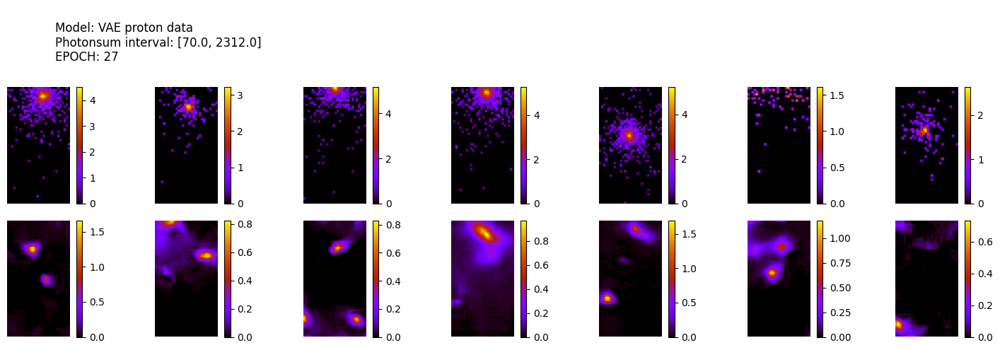

256/256 [==============================] - 1s 3ms/step
ws mean 113.93 ch1 0.14 ch2 93.17 ch3 0.73 ch4 191.02 ch5 284.58 Time for epoch 27 is 22.43750786781311 sec
7000 [Total loss: 86.86] [Recon_loss: 86.86] [KL loss: 0.00]


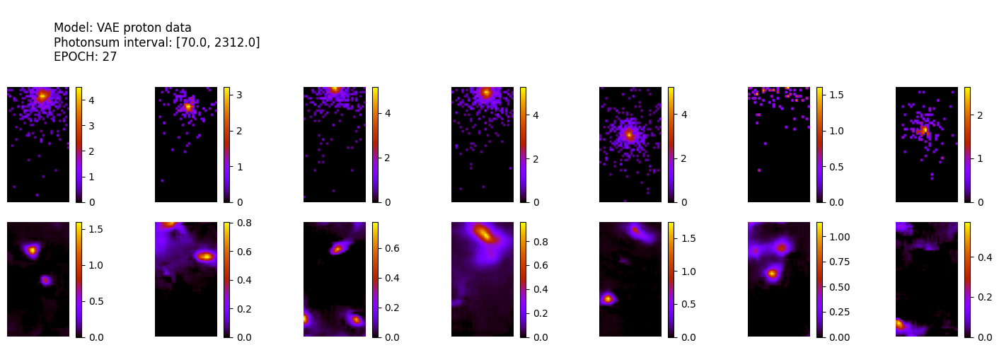

7100 [Total loss: 91.37] [Recon_loss: 91.37] [KL loss: 0.00]


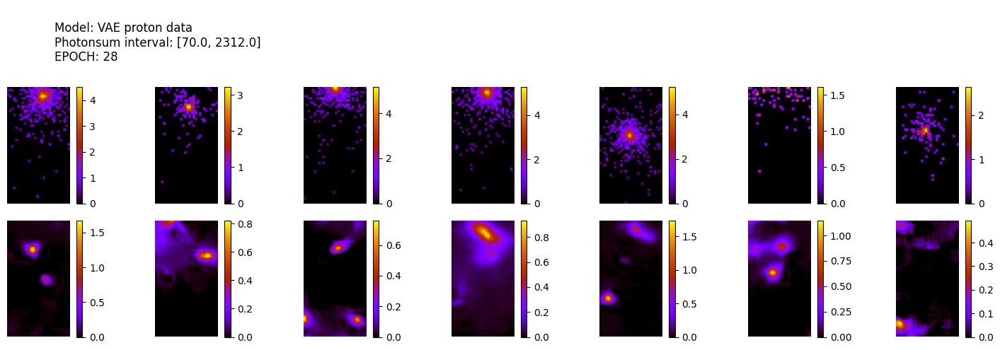

256/256 [==============================] - 1s 4ms/step
ws mean 114.08 ch1 0.14 ch2 93.41 ch3 0.74 ch4 191.14 ch5 284.95 Time for epoch 28 is 24.111167192459106 sec
7200 [Total loss: 86.34] [Recon_loss: 86.34] [KL loss: 0.00]
7300 [Total loss: 85.46] [Recon_loss: 85.46] [KL loss: 0.00]
7400 [Total loss: 81.44] [Recon_loss: 81.44] [KL loss: 0.00]


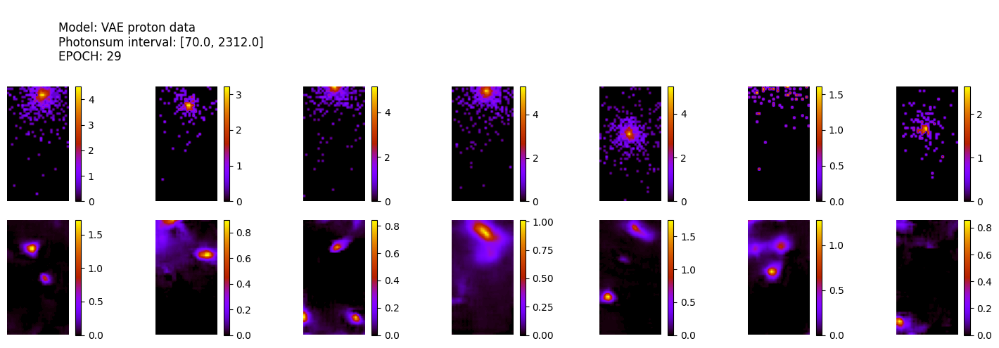

256/256 [==============================] - 1s 3ms/step
ws mean 113.16 ch1 0.13 ch2 92.18 ch3 0.73 ch4 190.10 ch5 282.65 Time for epoch 29 is 22.622609853744507 sec
7500 [Total loss: 83.29] [Recon_loss: 83.29] [KL loss: 0.00]
7600 [Total loss: 85.87] [Recon_loss: 85.87] [KL loss: 0.00]


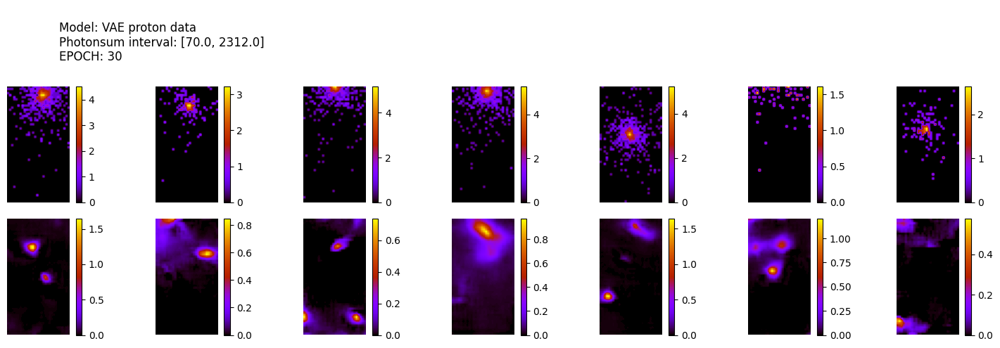

256/256 [==============================] - 1s 3ms/step
ws mean 114.27 ch1 0.14 ch2 93.88 ch3 0.72 ch4 191.17 ch5 285.45 Time for epoch 30 is 22.60088348388672 sec
7700 [Total loss: 89.71] [Recon_loss: 89.71] [KL loss: 0.00]
7800 [Total loss: 89.48] [Recon_loss: 89.48] [KL loss: 0.00]
7900 [Total loss: 92.58] [Recon_loss: 92.58] [KL loss: 0.00]


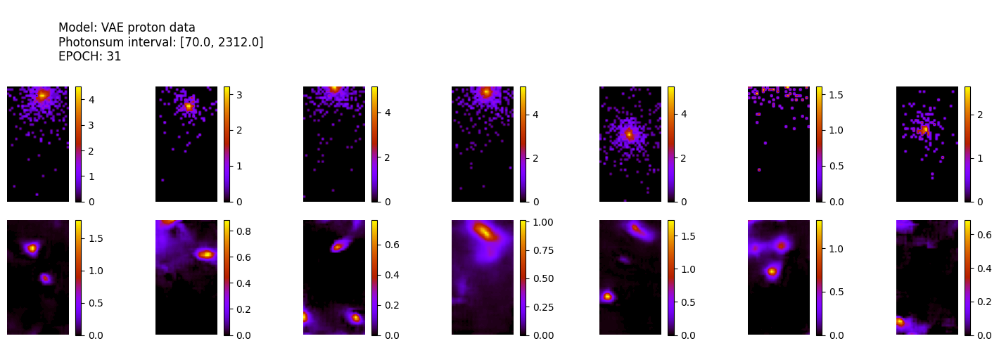

256/256 [==============================] - 1s 3ms/step
ws mean 113.02 ch1 0.13 ch2 91.93 ch3 0.74 ch4 190.00 ch5 282.30 Time for epoch 31 is 22.519505739212036 sec
8000 [Total loss: 86.83] [Recon_loss: 86.83] [KL loss: 0.00]


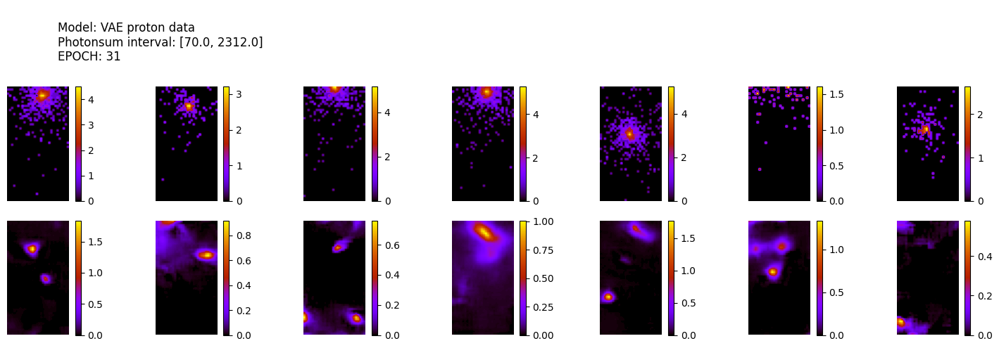

8100 [Total loss: 87.65] [Recon_loss: 87.65] [KL loss: 0.00]


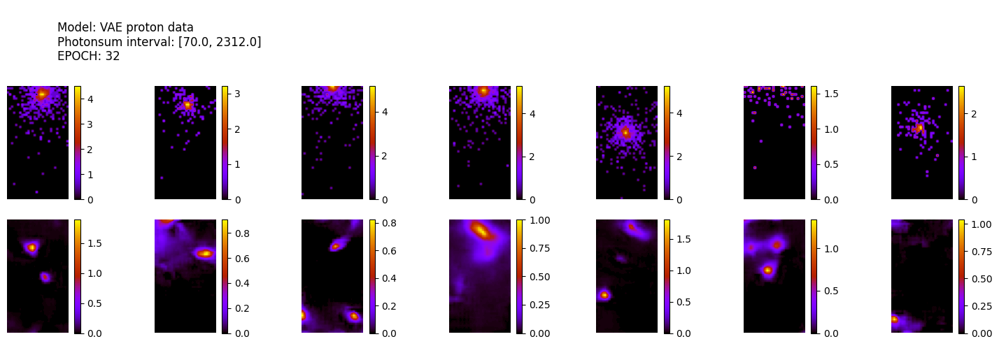

256/256 [==============================] - 1s 3ms/step
ws mean 113.39 ch1 0.13 ch2 92.40 ch3 0.73 ch4 190.44 ch5 283.26 Time for epoch 32 is 23.961252450942993 sec
8200 [Total loss: 86.02] [Recon_loss: 86.02] [KL loss: 0.00]
8300 [Total loss: 89.03] [Recon_loss: 89.03] [KL loss: 0.00]
8400 [Total loss: 82.09] [Recon_loss: 82.09] [KL loss: 0.00]


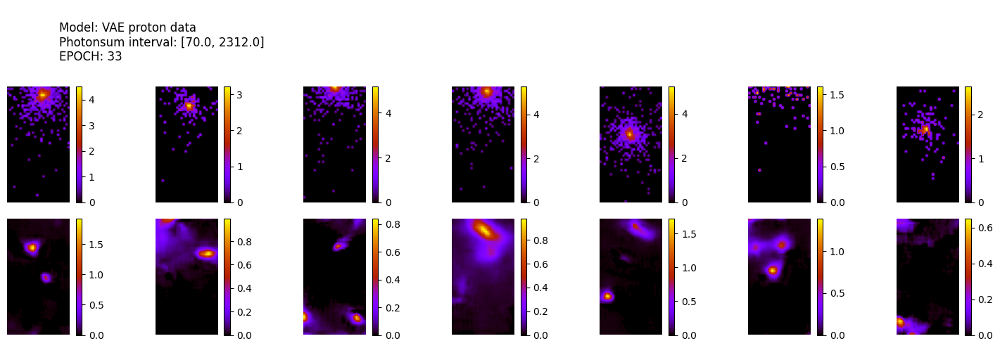

256/256 [==============================] - 1s 3ms/step
ws mean 113.25 ch1 0.13 ch2 92.19 ch3 0.72 ch4 190.32 ch5 282.91 Time for epoch 33 is 22.702224254608154 sec
8500 [Total loss: 87.26] [Recon_loss: 87.26] [KL loss: 0.00]
8600 [Total loss: 85.32] [Recon_loss: 85.32] [KL loss: 0.00]
8700 [Total loss: 90.89] [Recon_loss: 90.89] [KL loss: 0.00]


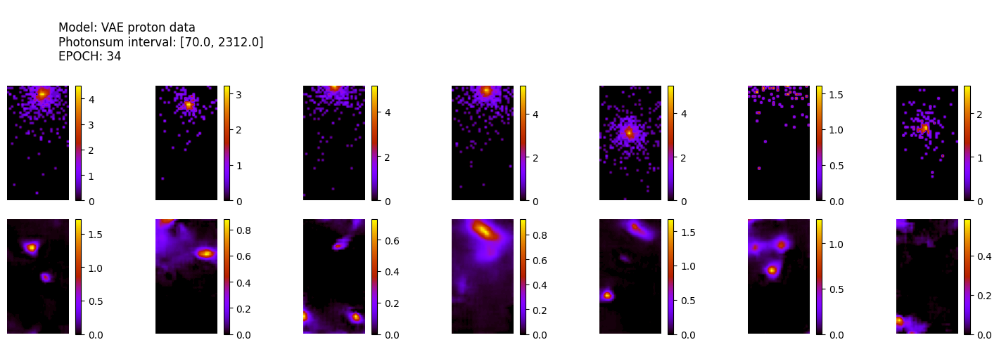

256/256 [==============================] - 1s 3ms/step
ws mean 114.64 ch1 0.13 ch2 94.30 ch3 0.74 ch4 191.63 ch5 286.37 Time for epoch 34 is 22.490506649017334 sec
8800 [Total loss: 92.29] [Recon_loss: 92.29] [KL loss: 0.00]
8900 [Total loss: 88.07] [Recon_loss: 88.07] [KL loss: 0.00]


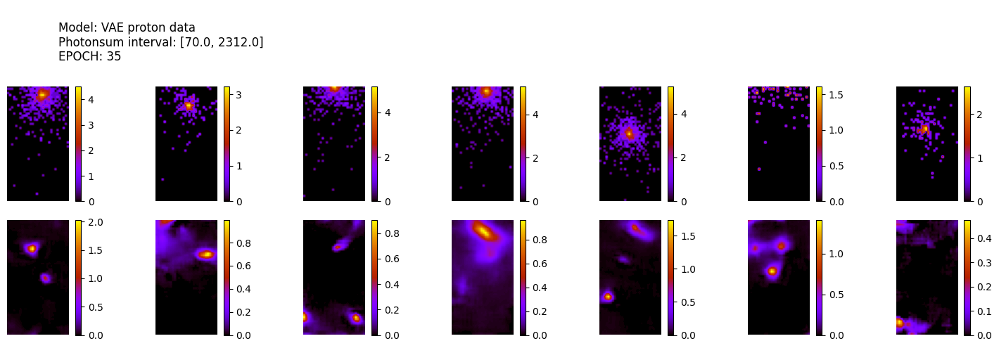

256/256 [==============================] - 1s 3ms/step
ws mean 112.18 ch1 0.13 ch2 90.60 ch3 0.73 ch4 189.23 ch5 280.19 Time for epoch 35 is 22.699621438980103 sec
9000 [Total loss: 89.53] [Recon_loss: 89.53] [KL loss: 0.00]


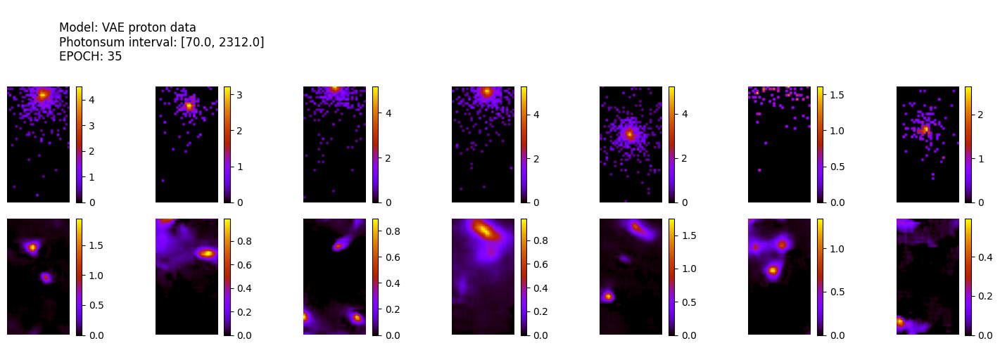

9100 [Total loss: 89.12] [Recon_loss: 89.12] [KL loss: 0.00]
9200 [Total loss: 89.60] [Recon_loss: 89.60] [KL loss: 0.00]


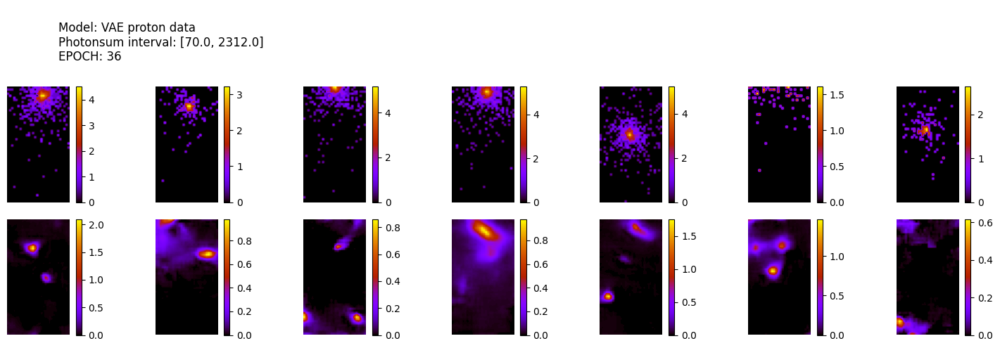

256/256 [==============================] - 1s 3ms/step
ws mean 112.28 ch1 0.13 ch2 90.69 ch3 0.73 ch4 189.38 ch5 280.47 Time for epoch 36 is 23.911166191101074 sec
9300 [Total loss: 85.21] [Recon_loss: 85.21] [KL loss: 0.00]
9400 [Total loss: 88.79] [Recon_loss: 88.79] [KL loss: 0.00]


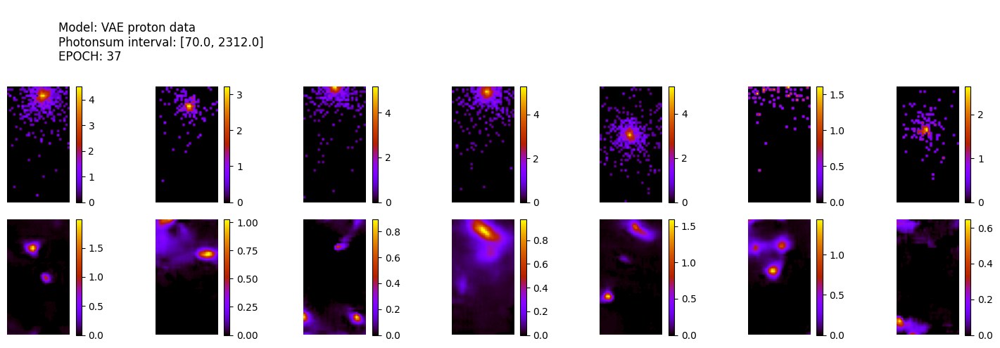

256/256 [==============================] - 1s 3ms/step
ws mean 112.20 ch1 0.12 ch2 90.60 ch3 0.72 ch4 189.30 ch5 280.28 Time for epoch 37 is 22.512503623962402 sec
9500 [Total loss: 90.33] [Recon_loss: 90.33] [KL loss: 0.00]
9600 [Total loss: 89.08] [Recon_loss: 89.08] [KL loss: 0.00]
9700 [Total loss: 90.30] [Recon_loss: 90.30] [KL loss: 0.00]


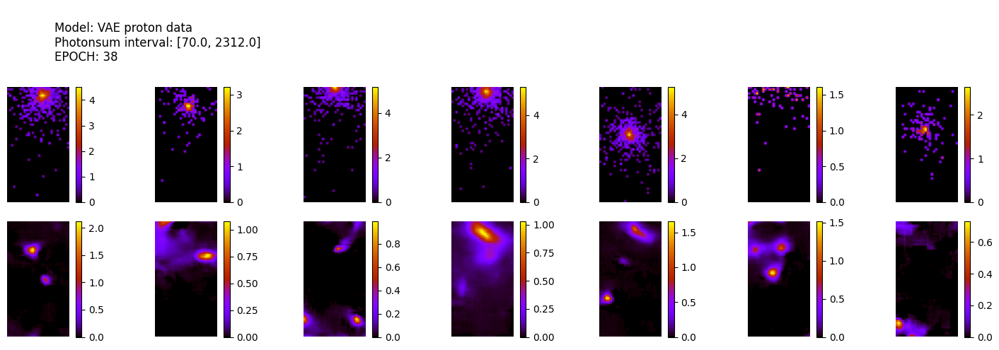

256/256 [==============================] - 1s 3ms/step
ws mean 110.05 ch1 0.12 ch2 87.37 ch3 0.73 ch4 187.17 ch5 274.88 Time for epoch 38 is 22.618699550628662 sec
9800 [Total loss: 86.30] [Recon_loss: 86.30] [KL loss: 0.00]
9900 [Total loss: 87.73] [Recon_loss: 87.73] [KL loss: 0.00]


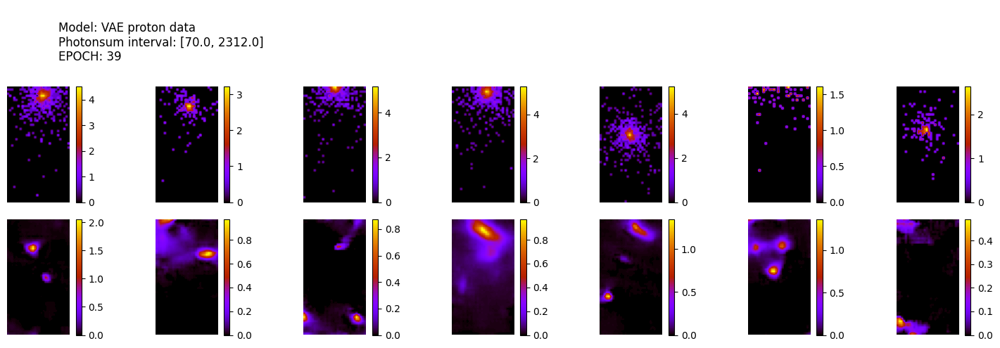

256/256 [==============================] - 1s 3ms/step
ws mean 113.56 ch1 0.13 ch2 92.85 ch3 0.73 ch4 190.42 ch5 283.68 Time for epoch 39 is 22.62430500984192 sec
10000 [Total loss: 89.39] [Recon_loss: 89.39] [KL loss: 0.00]


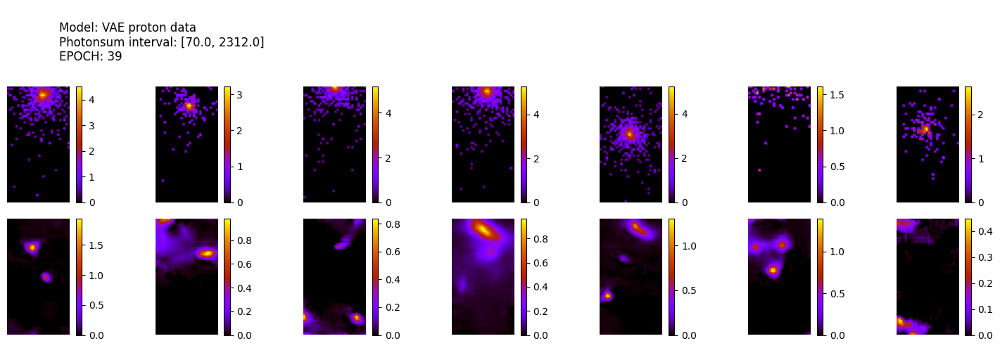

10100 [Total loss: 94.43] [Recon_loss: 94.43] [KL loss: 0.00]
10200 [Total loss: 83.60] [Recon_loss: 83.60] [KL loss: 0.00]


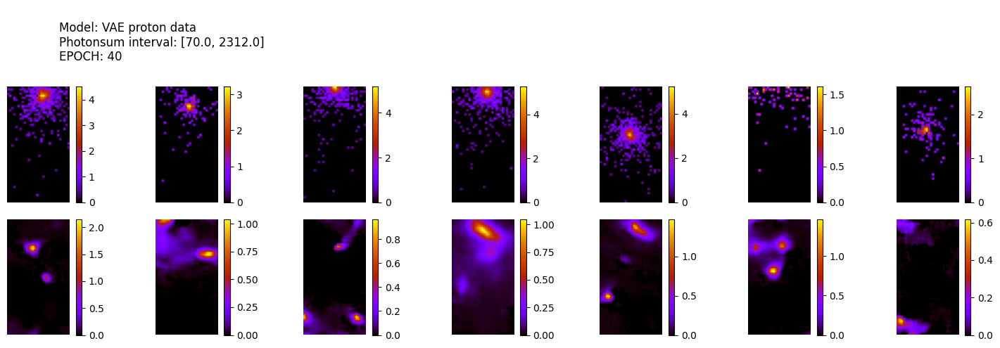

256/256 [==============================] - 1s 3ms/step
ws mean 110.39 ch1 0.12 ch2 88.31 ch3 0.71 ch4 187.04 ch5 275.75 Time for epoch 40 is 23.797073125839233 sec
10300 [Total loss: 91.60] [Recon_loss: 91.60] [KL loss: 0.00]
10400 [Total loss: 86.08] [Recon_loss: 86.08] [KL loss: 0.00]


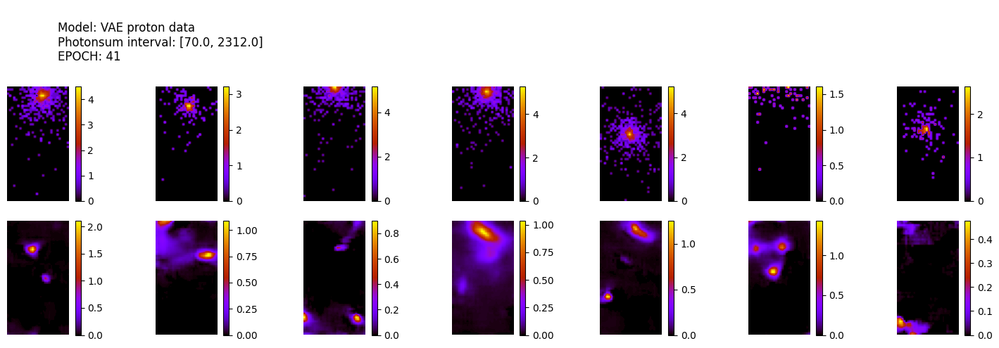

167/256 [==================>...........] - ETA: 0s

KeyboardInterrupt: 

In [20]:
history=train(dataset_with_cond, EPOCHS)

## Visualize losses

In [21]:
import seaborn as sns

sns.set_context('notebook', font_scale = 1)

In [22]:
# total_loss, reconstruction_loss, kl_loss
history_losses = np.array([[float(loss) for loss in losses] for losses in history])

In [23]:
total_loss = history_losses[:,0]
reconstruction_loss = history_losses[:,1]
kl_loss = history_losses[:,2]

In [24]:
a4_dims = (14, 5)
def print_loss(loss_values, loss_str):
    fig, ax = plt.subplots(figsize=a4_dims)
    sns.lineplot(loss_values)
    plt.xscale('log')
    ax.set_title(f"{loss_str} loss in each epoch")
    ax.set_xlabel("Epoch number")
    ax.set_ylabel(f"{loss_str} loss value")
    plt.savefig(os.path.join(filepath_img, f"{loss_str}_loss"))

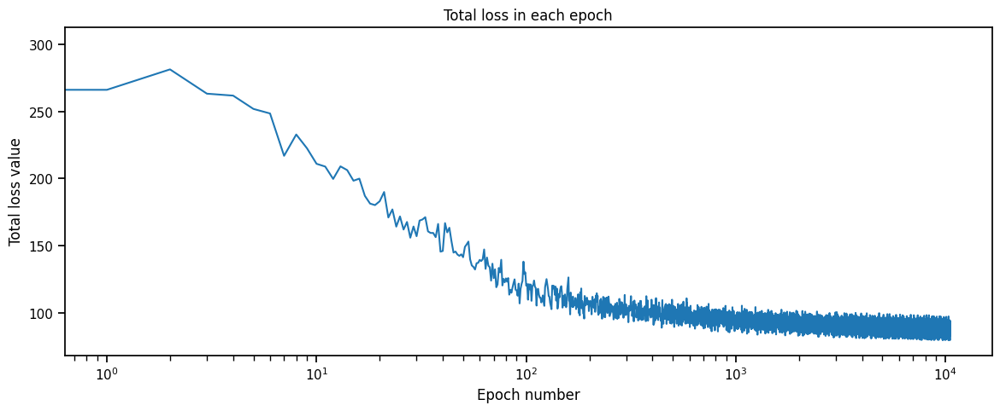

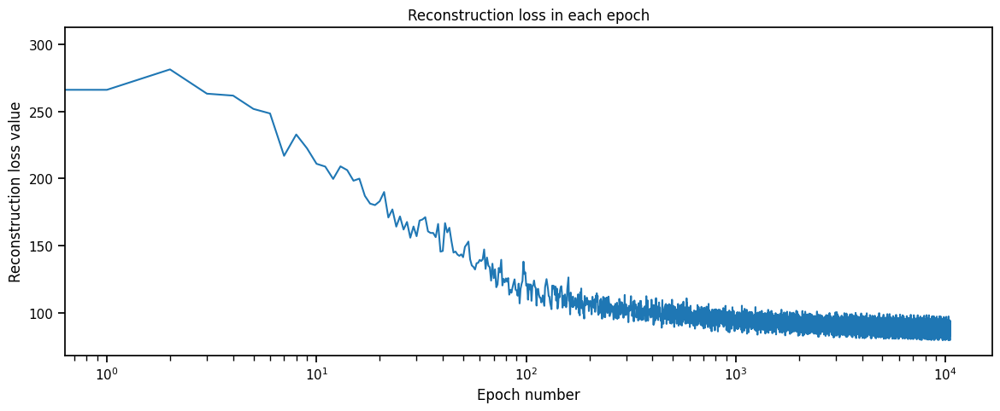

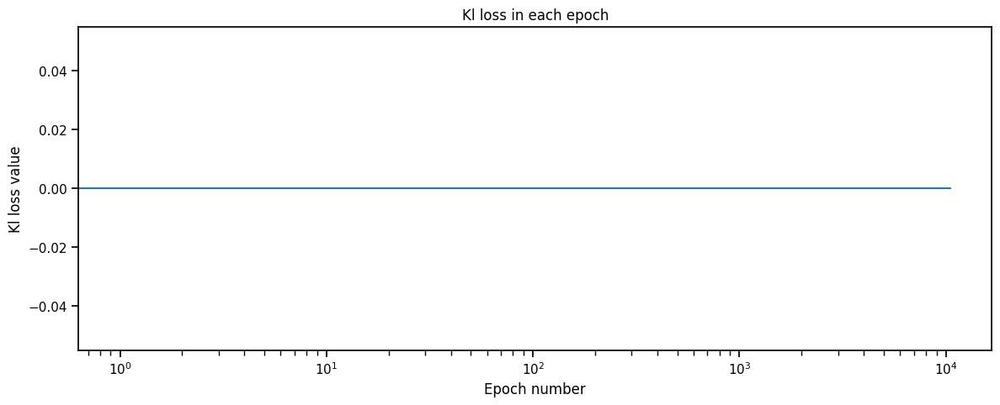

In [25]:
print_loss(total_loss, "Total")
print_loss(reconstruction_loss, "Reconstruction")
print_loss(kl_loss, "Kl")